# Рынок заведений общественного питания Москвы

Презентация: <https://disk.yandex.ru/i/kXv9rcXul1FjeQ>

<h2>Описание проекта <a class="tocSkip"> </h2>

**Заказчик** -  Фонд «Shut Up and Take My Money».
    
**Цель проекта** - Провести исследование рынка недвижимости для открытия заведения общественного питания в Москве.

**Задачи проекта:**
    
- Осуществить исследование коммерческой недвижимости Москвы
- Найти интересные особенности на рынке недвижимости
- Презентовать полученные результаты исследования


**Входные данные»** - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года (*файл moscow_places.csv*).
    
Ниже описаны обозначения столбцов:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
       и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

**План работ:**
<a id="introduction"></a>
- [Изучение общей информации](#start)
- [Предобработка данных](#preprocessing)
- [Анализ имеющихся данных](#analyzing)
- [Вывод](#end)
- [Детализируем исследование: открытие кофейни](#opencafe)
- [Сводные рекомендации по открытию кофейни](#recommendation)

## Изучение общей информации

<a id="start"></a>
[Описание проекта](#introduction)

In [355]:
#Импортируем библиотеку pandas
import pandas as pd

#Импортируем модуль библиотеки matplotlib  pyplot
import matplotlib.pyplot as plt

#Импортируем библиотеку для работы со временем
import datetime as dt

#Импортируем библиотеку seaborn
import seaborn as sns

# Импортируем библиотеку для графика воронки
import plotly.express as px

# Импортируем модуль библиотеки plotly 
from plotly import graph_objects as go

#Импортируем библиотеку для работы с регулярными выражениями
import re

#Подключаем модуль для работы с JSON-форматом
import json

#Импортируем кластер
from folium.plugins import MarkerCluster

#Импортируем карту и хороплет
from folium import Map, Choropleth, Marker

#Импортируем  библиотеку warnings и numpy для предотвращения возникновения всплывабщих ошибок
import warnings

#Код для предотвращения всплывающих ошибок
warnings.filterwarnings("ignore")

In [356]:
#Сохраним датасет в переменную df
df = pd.read_csv('moscow_places.csv')

In [357]:
#Выведем первые 5 строк датасета
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [358]:
#Выведем общую информацию о датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в датафрейме присутствует:
- 14 столбцов
- 8406 строк

In [359]:
#Изучим пропуски в датасете
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


- У небольшой части заведений (6.38%) отсутвуют часы работы, возможно, это круглосуточные заведения, стоит проверить
- Очень много пропусков в столбце, отражающем среднюю цену за чашку кофе (~94%), видимо, как заведения, так и клиенты редко проставляют цены на кофе в отзывах
- У половины заведений отсутствует информация о количестве посадочных мест
- Приблизительно одинаковое количество пропусков в столбцах `price`, `avg_bill`, `middle_avg_bill`

## Предобработка данных

<a id="preprocessing"></a>
[Описание проекта](#introduction)

### Обработка пропусков

In [360]:
#Проверим датасет на наличие дубликатов
df.duplicated().sum()

0

Дубликатов не обнаружилось

In [361]:
#Проверим категории заведений на наличие неявных дубликатов
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Дубликатов не обнаружилось

In [362]:
#Проверим наименование административных округов на наличие неявных дубликатов
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Дубликатов не обнаружилось

In [363]:
#Изучим строки, в которых пропущенно время работы
df[df['hours'].isna() == True].head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,NaN,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,NaN,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,NaN,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,NaN,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,NaN,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
123,Кафе,кафе,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897794,37.591395,4.3,NaN,NaN,NaN,NaN,0,50.0
126,Кулинария,кафе,"Москва, Череповецкая улица, 17",Северо-Восточный административный округ,NaN,55.898741,37.585301,3.9,NaN,NaN,NaN,NaN,1,NaN
138,Хинкальная,быстрое питание,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,NaN,55.897751,37.591363,4.1,NaN,NaN,NaN,NaN,1,50.0
217,16 Июня,кафе,"Москва, бульвар Академика Ландау, 3",Северо-Восточный административный округ,NaN,55.920370,37.552150,1.4,NaN,NaN,NaN,NaN,0,NaN
274,Чайхана,кафе,"Москва, Широкая улица, 12",Северо-Восточный административный округ,NaN,55.886840,37.659610,3.0,NaN,NaN,NaN,NaN,1,50.0


In [364]:
df[df['hours'].isna() == True]['name'].count()

536

`536` строк, в которых не указано время работы

In [365]:
#Количество уникальных категорий
df['category'].nunique()

8

Количество уникальных категорий заведений - 8

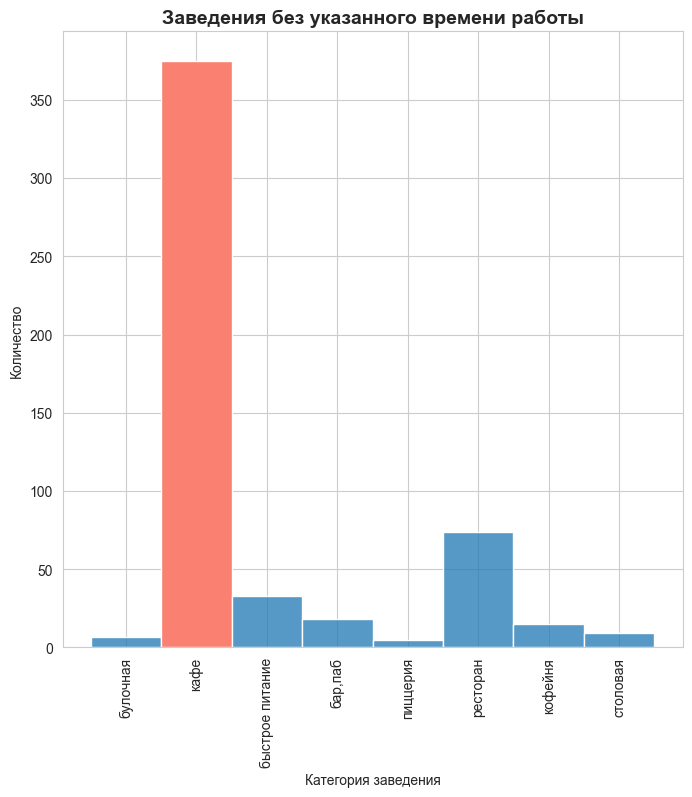

In [366]:
#Построим график, отражающий количество заведений с пропусками в часах работы
sns.set_style('whitegrid') 
fig, ax = plt.subplots()
ax = sns.histplot(x='category',data=df[df['hours'].isna() == True])
plt.xticks(rotation = 90)
ax.set_title('Заведения без указанного времени работы', fontweight="bold", fontsize=14)
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Количество')
ax.patches[1].set_facecolor('salmon')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(8)

Как мы видим, в каждом типе заведений присутсвуют пропуски, соответсвенно, мы не можем утверждать, что пропуски обозначают круглосуточное заведение (будь то бары, пабы, рестораны и тому подобные заведения), значит, их можно удалить.

Наибольшее количество пропусков у заведений с категорией `кафе`, возможно, это связанно с тем, что во всем датасете заведений этой категории больше всего (это мы выясним дальше).

In [367]:
df = df[df['hours'].isna() == False].reset_index()

В остальных столбцах имеет смысл заполнить пропуски заглушкой "Не указано"

In [368]:
df = df.fillna('не_указано')

### Добавление новых столбцов

In [369]:
#Добавим новый столбец с указанием улицы заведения
for i in range(len(df)):
    #Используем регулярные выражения для вычленения названия улиц между запятыми
    m = re.search(', (.+?),', df.loc[i, 'address'])
    if m:
        found = m.group(1)
    df.loc[i, 'street'] = found

In [370]:
#Добавим столбец, содержаний информацию о том, круглосуточное ли заведение
df['is_24/7'] = df['hours'].str.contains('круглосуточно', regex=False)

In [371]:
#Посмотрим, как теперь выглядит наш датафрейм
df.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,не_указано,не_указано,не_указано,не_указано,0,не_указано,улица Дыбенко,False
1,1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,не_указано,0,4.0,улица Дыбенко,False
2,2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,не_указано,0,45.0,Клязьминская улица,False
3,3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,не_указано,Цена чашки капучино:155–185 ₽,не_указано,170.0,0,не_указано,улица Маршала Федоренко,False
4,4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,не_указано,1,148.0,Правобережная улица,False


## Анализ имеющихся данных

<a id="analyzing"></a>
[Описание проекта](#introduction)

### Категории заведений

In [372]:
labels = []
values = []
#Напишем цикл для заполнения списков и построения круговой диаграммы
for value in df['category'].unique():
    labels.append(value)
    values.append(df[df['category']==value]['category'].count())

In [373]:
print(labels)
print(values)

['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая']
[2003, 1969, 1398, 628, 747, 570, 249, 306]


In [374]:
#Напишем для параметра "explode" кортеж со значениями для выделения самой большой доли
explode = (0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)

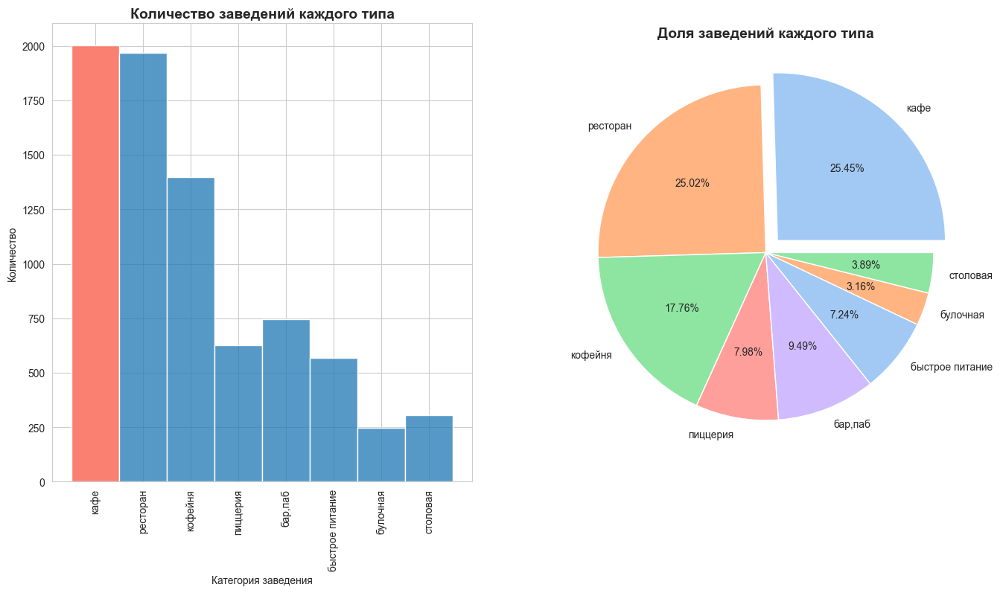

In [375]:
sns.set_style('whitegrid') 
fig, (ax1, ax2) = plt.subplots(1, 2)

#Построение первого графика
plt.subplot(1, 2, 1)
ax1 = sns.histplot(x='category',data=df)
plt.xticks(rotation = 90)
ax1.set_title('Количество заведений каждого типа', fontweight="bold", fontsize=14)
ax1.set_xlabel('Категория заведения')
ax1.set_ylabel('Количество')
ax1.patches[0].set_facecolor('salmon')

#Построение 2 графика
plt.subplot(1, 2, 2)
colors = sns.color_palette('pastel')[0:5]
ax2 = plt.pie(values, labels = labels, colors = colors, autopct='%.2f%%', explode=explode)
plt.title('Доля заведений каждого типа', fontweight="bold", fontsize=14)

#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(16)

In [376]:
#Выведем через цикл полученные результаты
print('В датасете представленны следующие категории заведений (в порядке убывания количества заведений):')
for _ in range(len(labels)):
    print(f'Количество заведений категории {labels[_]} составляет:' f'{values[_]} заведений' f'({round(values[_] / sum(values)* 100, 2)}%)')
    print('-------------------------------------------------------------')

В датасете представленны следующие категории заведений (в порядке убывания количества заведений):
Количество заведений категории кафе составляет:2003 заведений(25.45%)
-------------------------------------------------------------
Количество заведений категории ресторан составляет:1969 заведений(25.02%)
-------------------------------------------------------------
Количество заведений категории кофейня составляет:1398 заведений(17.76%)
-------------------------------------------------------------
Количество заведений категории пиццерия составляет:628 заведений(7.98%)
-------------------------------------------------------------
Количество заведений категории бар,паб составляет:747 заведений(9.49%)
-------------------------------------------------------------
Количество заведений категории быстрое питание составляет:570 заведений(7.24%)
-------------------------------------------------------------
Количество заведений категории булочная составляет:249 заведений(3.16%)
-------------------

Самая:
- большая доля у заведений типа `кафе` (25.45%) и `ресторан` (25.02%)
- маленькая доля у заведений типа `булочная` (3.16%) и `столовая` (3.89%)

### Количество посадочных мест

In [377]:
# Напишем цикл для построения гистограммы количества мест по всем категориям заведения
for value in df['category'].unique():
    data = df[df['category']==value]
    fig = px.histogram(df[df['category']==value],
                       x='seats',
                       nbins=30)
    

# Оформим график
    fig.update_xaxes(tickangle=45)
    fig.update_layout(title=f'Количество мест заведений категории {value}',
                       xaxis_title='Количество заведений',
                       yaxis_title='Количество мест в данной категории',
                       bargap=0.2)
    fig.show() 

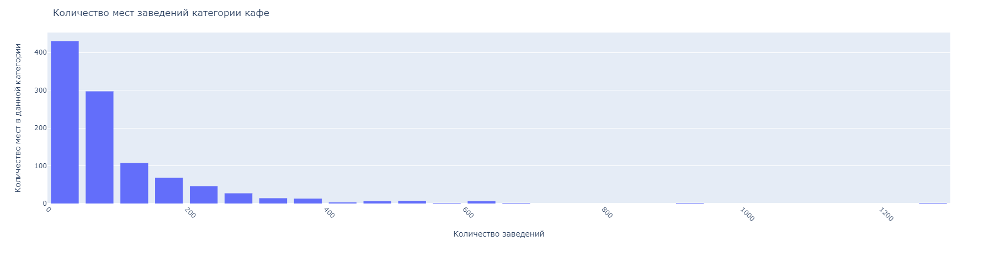

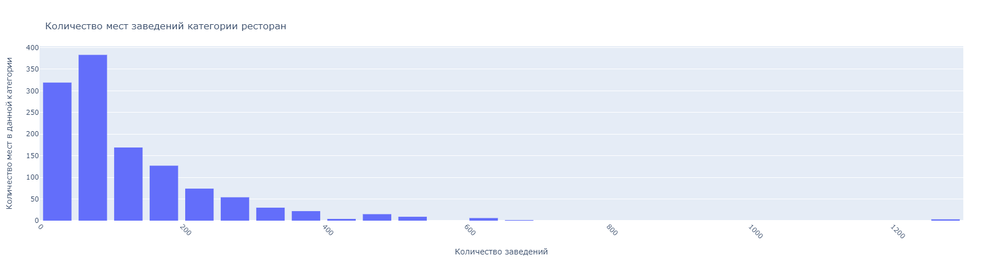

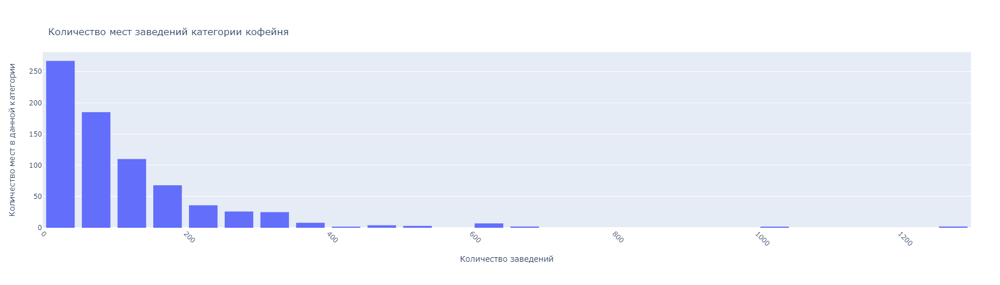

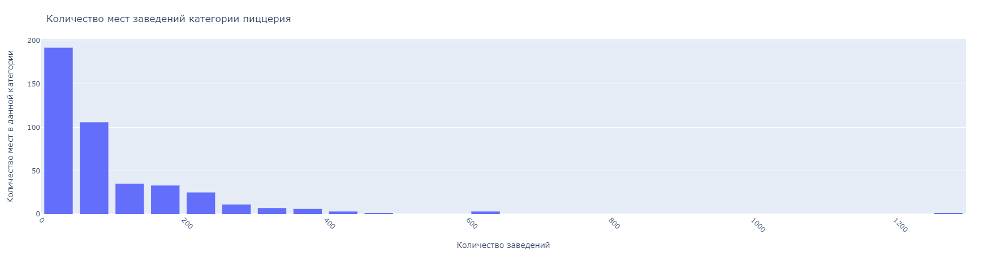

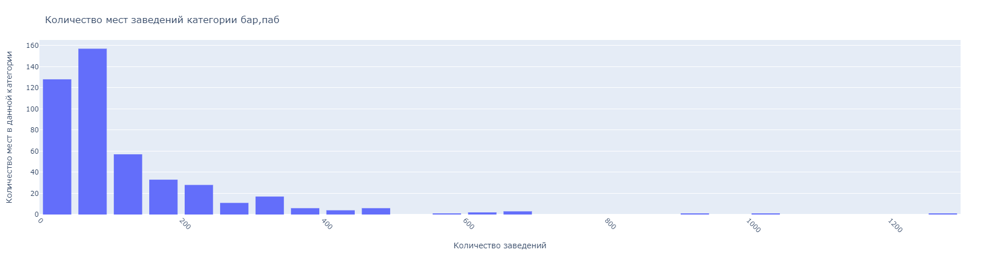

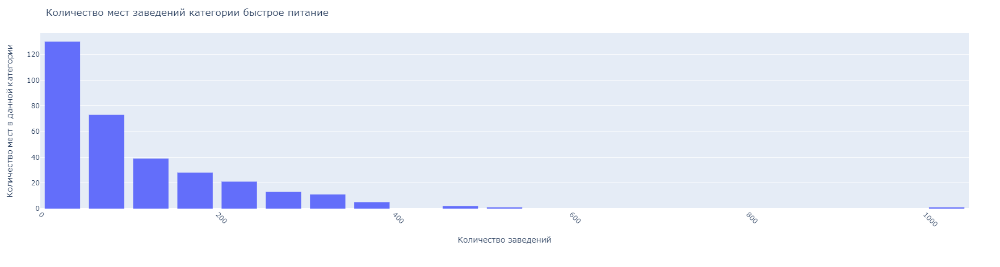

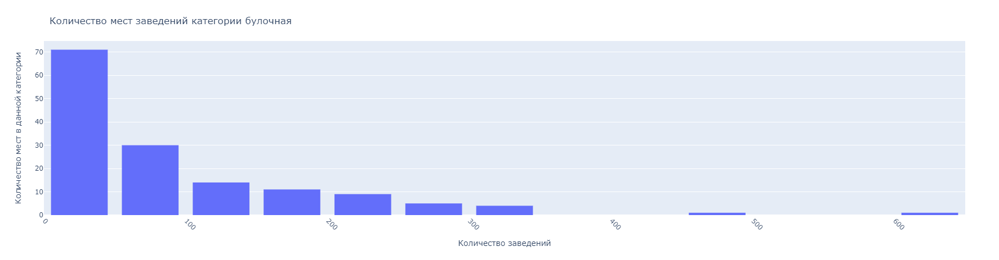

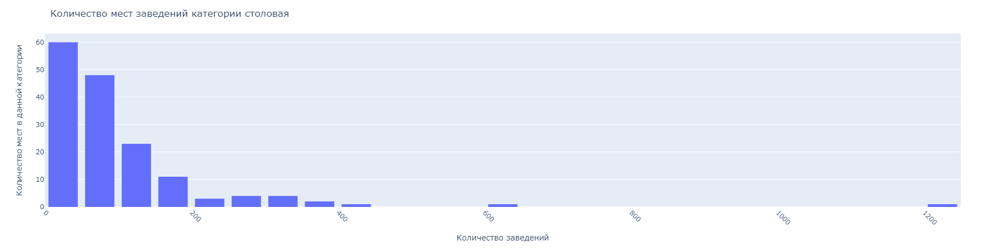

Следующие наиболеее часто встречающиеся диапозоны количеств мест характерны для каждой категории, соответсвенно:
   - кафе: 0 - 49 (430 заведений)
   - ресторан: 50 - 99 (383 заведения)
   - кофейня: 0 - 49 (267 заведений)
   - пиццерия: 0 - 49 (192 заведения)
   - бар, паб: 50 - 99 (157 заведений)
   - быстрое питание: 0 - 49 (130 заведений)
   - булочная: 0 - 49 (71 заведение)
   - столовая: 0 - 49 (60 заведений)

In [378]:
#Составим сводную таблицу для изучения медианного количества мест вы заведениях каждой категории
df_ouf_plug = df[df['seats']!='не_указано']
df_ouf_plug['seats'] = df_ouf_plug['seats'].astype('int')
pivot_seats = (df_ouf_plug.groupby('category', as_index=False)
               .agg({'seats':['median']})
               .droplevel(1,axis=1)
               .sort_values(by='seats', ascending = False))

In [379]:
pivot_seats

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,73.5
2,быстрое питание,69.5
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


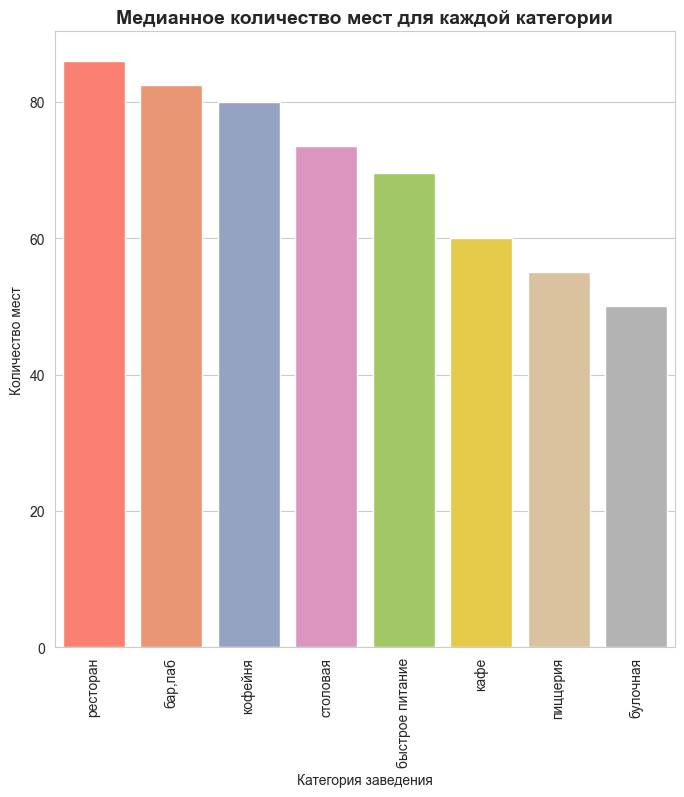

In [380]:
#Зададим базовые параметры визуального оформления
sns.set_style('whitegrid')
palette = sns.color_palette("Set2")

#Построим столбчатую диаграмму
fig, ax = plt.subplots()
ax = sns.barplot(x='category', y='seats', data=pivot_seats, palette = palette)
plt.xticks(rotation = 90)
ax.set_title('Медианное количество мест для каждой категории', fontweight="bold", fontsize=14)
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Количество мест')
ax.patches[0].set_facecolor('salmon')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(8)

Было решено провести оценку не по средней, а по медиане, потому что есть заведения (можно посмотреть на гистограмме для каждого заведения), которые сильно выбиваются из общей массы по количеству сидячих мест в каждой категории.

In [381]:
#Выведем через цикл полученные результаты

for _ in range(len(pivot_seats)):
    print(f'Медианное значение мест для категории {pivot_seats.loc[_][0]} составляет:' f'{pivot_seats.loc[_][1]}')
    print('-------------------------------------------------------------')

Медианное значение мест для категории бар,паб составляет:82.5
-------------------------------------------------------------
Медианное значение мест для категории булочная составляет:50.0
-------------------------------------------------------------
Медианное значение мест для категории быстрое питание составляет:69.5
-------------------------------------------------------------
Медианное значение мест для категории кафе составляет:60.0
-------------------------------------------------------------
Медианное значение мест для категории кофейня составляет:80.0
-------------------------------------------------------------
Медианное значение мест для категории пиццерия составляет:55.0
-------------------------------------------------------------
Медианное значение мест для категории ресторан составляет:86.0
-------------------------------------------------------------
Медианное значение мест для категории столовая составляет:73.5
-------------------------------------------------------------

Самое:
- большое медианное значение у заведений типа `ресторан` - 86
- маленькое медианное значение у заведений типа`булочная` - 50

### Соотношение сетевых и несетевых заведений

In [382]:
#Таблица для анализа сетевых и несетевых заведений
chain_p = pd.DataFrame(columns=['Число заведений', 'Тип заведения'])
chain_p['Число заведений'] = df.groupby(by='chain')['chain'].count()
chain_p['Тип заведения'] = ['Несетевое', 'Сетевое']

In [383]:
chain_p

,Число заведений,Тип заведения
chain,,
0,4781,Несетевое
1,3089,Сетевое


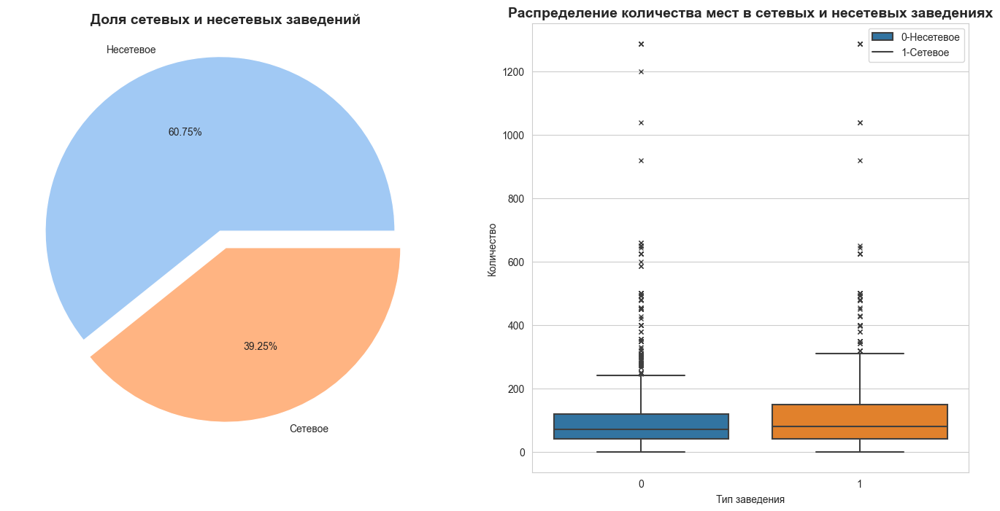

In [384]:
#Зададим базовые параметры визуального оформления
colors = sns.color_palette('pastel')[0:5]

fig, (ax1, ax2) = plt.subplots(1, 2)

#Круговая диаграмма
plt.subplot(1, 2, 1)
ax1 = plt.pie(chain_p['Число заведений'],
             labels = chain_p['Тип заведения'],
             colors = colors, autopct='%.2f%%',
             explode = (0.1, 0.0))
plt.title('Доля сетевых и несетевых заведений', fontweight="bold", fontsize=14)

#Ящик с усами
plt.subplot(1, 2, 2)
ax2 = sns.boxplot(x='chain',y='seats', data=df[df['seats']!='не_указано'],
                 flierprops={"marker": "x"})
ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Количество')
ax2.legend(labels=['0-Несетевое', '1-Сетевое'])
plt.title('Распределение количества мест в сетевых и несетевых заведениях', fontweight="bold", fontsize=14)

#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(17)


Количество:
- Несетевых заведений - 4781 (60.75%)
- Сетевых заведений - 3089 (39.25%)

Интересное наблюдение, в несетевых местах больше выбросов по количеству мест (можно объяснить тем, что в сетевых местах есть стандарты, в которых определяется даже количество мест)

### Категории заведений в разрезе его типа

In [385]:
chain_1 = []
for value in df['category'].unique():
    chain_1.append(df[(df['category']==value) & (df['chain']==1)]['category'].count())

In [386]:
df_share_chain = pd.DataFrame(columns=['labels', 'count_of_places', 'yes_chain'])
df_share_chain['labels'] = labels
df_share_chain['count_of_places'] = values
df_share_chain['yes_chain'] = chain_1
df_share_chain['share_yes_chain'] = round(df_share_chain['yes_chain'] / df_share_chain['count_of_places'], 2)
df_share_chain = df_share_chain.sort_values(by='share_yes_chain', ascending = False).reset_index(drop=True)

In [387]:
df_share_chain

,labels,count_of_places,yes_chain,share_yes_chain
0,булочная,249,154,0.62
1,пиццерия,628,330,0.53
2,кофейня,1398,714,0.51
3,быстрое питание,570,224,0.39
4,ресторан,1969,712,0.36
5,кафе,2003,711,0.35
6,столовая,306,85,0.28
7,"бар,паб",747,159,0.21


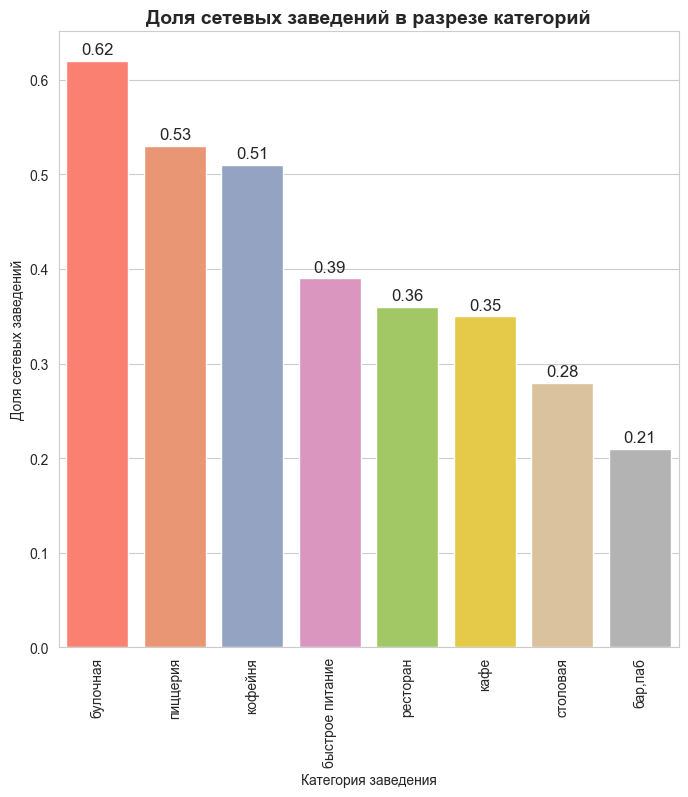

In [388]:
#Зададим базовые параметры визуального оформления
sns.set_style('whitegrid')
palette = sns.color_palette("Set2")

#Построим столбчатую диаграмму
fig, ax = plt.subplots()
ax = sns.barplot(x='labels', y='share_yes_chain', data=df_share_chain, palette = palette)
plt.xticks(rotation = 90)
ax.set_title('Доля сетевых заведений в разрезе категорий', fontweight="bold", fontsize=14)
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Доля сетевых заведений')
ax.patches[0].set_facecolor('salmon')

#Добавим подписи к данным
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
    

#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(8)

Следующие категории заведения чаще являются сетевыми:
   - булочная (62% сетевых заведений)
   - пиццерия (53% сетевых заведений)
   - кофейня (51% сетевых заведений)



### Топ - 15 популярных сетей в Москве

In [389]:
# Создадим сводную таблицу, содержащую топ - 15 заведений по их количеству
pivot_top = (df.pivot_table(index = ['category','name','chain'], 
                       values =['street'],
                       aggfunc ='count')
         .sort_values(by='street',ascending=False)
         .rename(columns={'street': 'count_of_places'})).head(15)

In [390]:
pivot_top

count_of_places
category        name                                chain                 
кофейня         Шоколадница                         1                  119
кафе            Кафе                                0                   79
пиццерия        Домино'с Пицца                      1                   76
                Додо Пицца                          1                   74
кофейня         One Price Coffee                    1                   71
ресторан        Яндекс Лавка                        1                   68
кофейня         Cofix                               1                   65
ресторан        Prime                               1                   49
кофейня         КОФЕПОРТ                            1                   42
кафе            Кулинарная лавка братьев Караваевых 1                   39
ресторан        Теремок                             1                   36
кофейня         CofeFest                            1                   31
быстрое питание Шаурма                              0                   25
кафе            Drive Café                          1                   24
булочная        Буханка                             1                   24

In [391]:
#Сделаем датасет для построения барплота
for_barplot = (pivot_top
               .droplevel([1,2],axis=0)
               .groupby((pivot_top.droplevel([1,2],axis=0)).index)
               .agg({'count_of_places':'sum'})
               .sort_values(by='count_of_places', ascending = False))

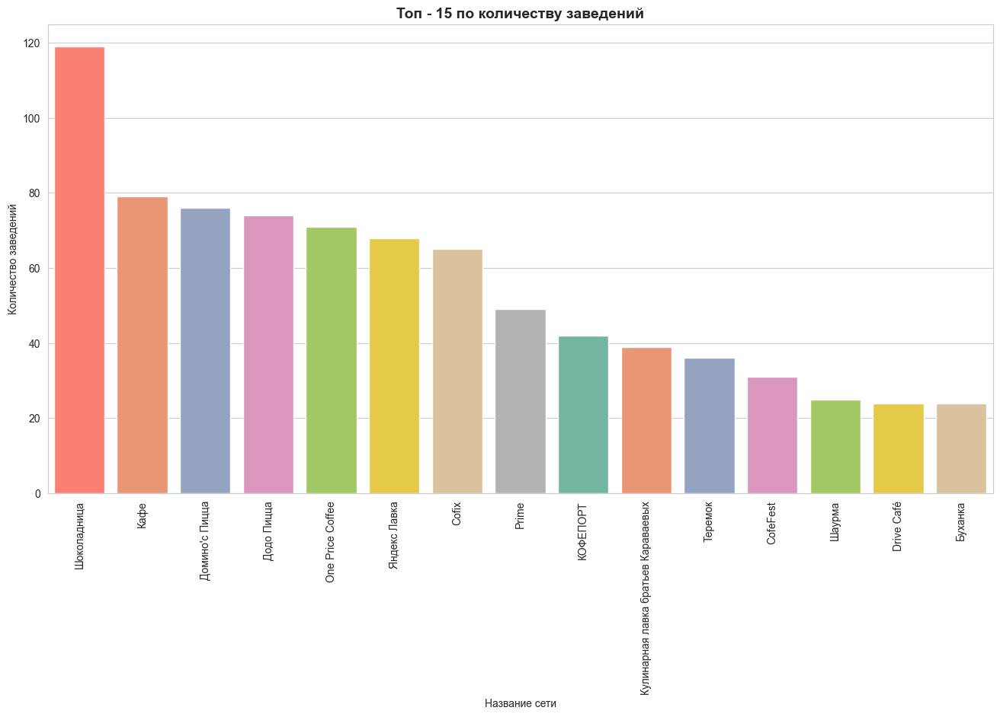

In [392]:
#Построим столбчатую диаграмму
fig, ax = plt.subplots()
ax = sns.barplot(x=pivot_top.index.get_level_values('name'), y='count_of_places', data=pivot_top, palette = palette)
plt.xticks(rotation = 90)
ax.set_title('Топ - 15 по количеству заведений', fontweight="bold", fontsize=14)
ax.set_xlabel('Название сети')
ax.set_ylabel('Количество заведений')
ax.patches[0].set_facecolor('salmon')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(16)

In [393]:
#Создадим интерактивную круговую диаграмму
fig = go.Figure(data=[go.Pie(labels=pivot_top.index.get_level_values('name'), values=pivot_top['count_of_places'])])
fig.update_layout(title='Топ - 15 по количеству заведений (доли от общего числа из топ-15)')
fig.show()

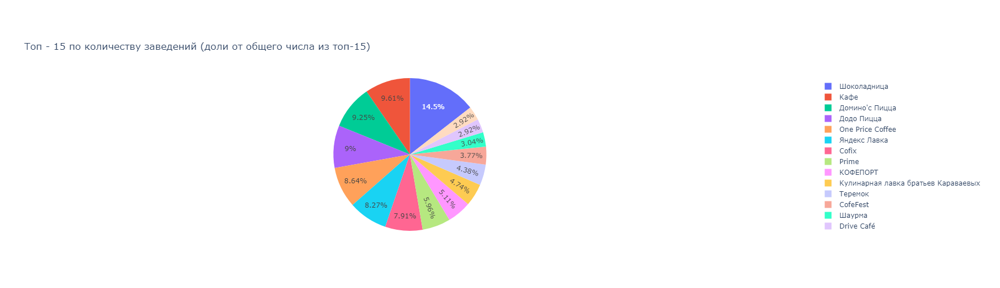

In [394]:
#Напишем цикл для текстового описания круговой диаграммы
for _ in range(len(pivot_top)):
    (print('Сеть {0} занимает следующую долю от всего топ 15: {1}%'
           .format(pivot_top.index.get_level_values('name')[_],
                   round(pivot_top['count_of_places'][_] / sum(pivot_top['count_of_places']) * 100, 2))))
    print('-------------------------------------------------------------')

Сеть Шоколадница занимает следующую долю от всего топ 15: 14.48%
-------------------------------------------------------------
Сеть Кафе занимает следующую долю от всего топ 15: 9.61%
-------------------------------------------------------------
Сеть Домино'с Пицца занимает следующую долю от всего топ 15: 9.25%
-------------------------------------------------------------
Сеть Додо Пицца занимает следующую долю от всего топ 15: 9.0%
-------------------------------------------------------------
Сеть One Price Coffee занимает следующую долю от всего топ 15: 8.64%
-------------------------------------------------------------
Сеть Яндекс Лавка занимает следующую долю от всего топ 15: 8.27%
-------------------------------------------------------------
Сеть Cofix занимает следующую долю от всего топ 15: 7.91%
-------------------------------------------------------------
Сеть Prime занимает следующую долю от всего топ 15: 5.96%
-------------------------------------------------------------
Сет

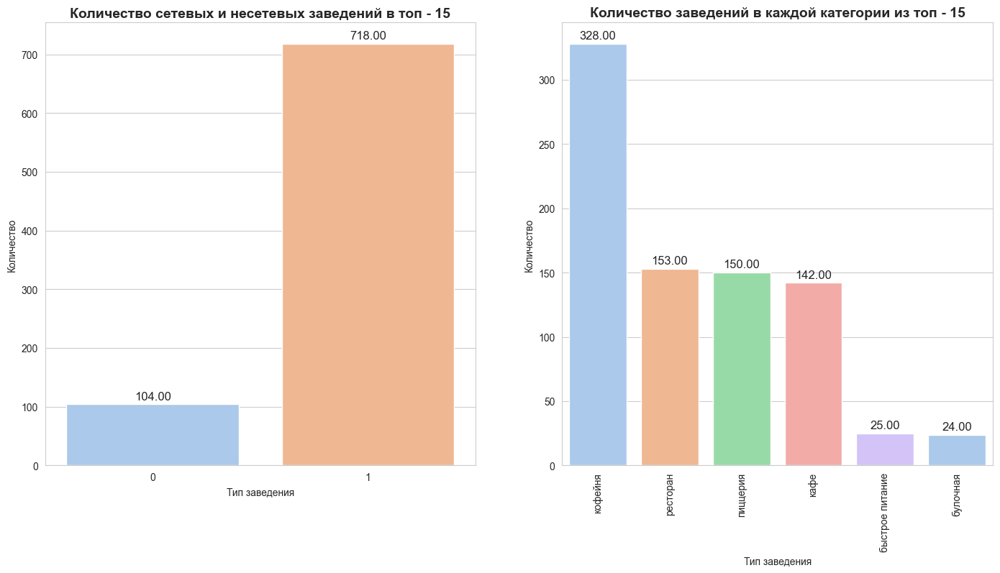

In [395]:
#Сохраним цветовую палетку в переменную
colors = sns.color_palette('pastel')[0:5]

#Зададим оси
fig, (ax1, ax2) = plt.subplots(1, 2)

#Построим первый график 
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x=pivot_top.index.get_level_values('chain'),
                  y=pivot_top['count_of_places'],
                  data=pivot_top,
                  estimator=sum,
                  ci=None,
                  palette = colors)
ax1.set_title('Количество сетевых и несетевых заведений в топ - 15', fontweight="bold", fontsize=14)
ax1.set_xlabel('Тип заведения')
ax1.set_ylabel('Количество')
#Добавим подписи данных на графике
for bar in ax1.patches:
    ax1.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
    
#Построим второй график
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x=for_barplot.index,
                  y=for_barplot['count_of_places'],
                  estimator=sum,
                  ci=None,
                  palette = colors)
plt.xticks(rotation = 90)
ax2.set_title('Количество заведений в каждой категории из топ - 15', fontweight="bold", fontsize=14)
ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Количество')
#Добавим подписи данных на графике
for bar in ax2.patches:
    ax2.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(17)

В топ - 15 попались заведения у которых указано не их оригинальное название, а название по продукту, который они производят (к сетевым заведениям они также не относятся):
- Кафе (79 заведений с таким названием)
- Шаурма (25 заведений с таким названием)

Количество сетевых заведений в топе явно больше:
- Несетевые (104 заведения) - это те самые заведения под наименованиями `Кафе` и `Шаурма`
- Сетевые (718 заведений)

Количество заведений в каждой категории получилось следующим:
- Кофейня (328Ф)
- Кафе (153)
- Ресторан (150)
- Булочная (142)
- Быстрое питание (25)
- Пиццерия (24)

### Анализ административных районов

In [396]:
#Создадим сводную таблицу для построения барплота
pivot_district = df.pivot_table(index='district', columns='category',
                       values =['street'],
                       aggfunc ='count')

In [397]:
#Удалим лишний уровнь индексов
pivot_district = pivot_district.droplevel(0, axis=1)

In [398]:
#Отсортируем датасет по количеству заведений
pivot_district['sum'] = pivot_district.sum(axis=1)
pivot_district = pivot_district.sort_values(by='sum', ascending = False)

In [399]:
pivot_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
district,,,,,,,,,
Центральный административный округ,364,50,85,444,426,112,665,65,2211
Северный административный округ,65,37,54,206,191,76,179,38,846
Северо-Восточный административный округ,57,28,79,229,157,66,174,40,830
Южный административный округ,65,25,81,215,130,73,195,43,827
Западный административный округ,48,36,60,191,148,71,207,24,785
Восточный административный округ,51,23,66,218,102,71,153,39,723
Юго-Западный административный округ,37,26,57,196,94,64,159,17,650
Юго-Восточный административный округ,37,12,61,218,88,55,135,23,629
Северо-Западный административный округ,23,12,27,86,62,40,102,17,369


In [400]:
#Удалим столбец для удоства построения диаграммы
pivot_district = pivot_district.drop(columns=['sum'])

In [401]:
#Построим столбчатую диаграмму
fig = px.bar(pivot_district,
             x=pivot_district.index,
             y=pivot_district.columns)


#Оформим график
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество заведений различных категорий по районам',
                   xaxis_title='Название района',
                   yaxis_title='Количество заведений')
fig.show() 

В датасете присутвуют следующие районы:
- Центральный административный округ - больше всего заведений различных категорий
- Западный административный округ
- Южный административный округ
- Северный административный округ
- Северо-Восточный административный округ
- Юго-Западный административный округ
- Восточный административный округ
- Юго-Восточный административный округ
- Северо-Западный административный округ - меньше всего заведений различных категорий

По графику видно, что подавляющее большинство от всех заведений в каждом районе составляют `рестораны` и `кафе`.

### Распределение средних рейтингов

Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [402]:
#Создадим фрейм со средними значениями рейтинга для построения диаграммы
data_frame = round(df.groupby(['category'])['rating'].mean().sort_values(), 2)

In [403]:
data_frame

category
быстрое питание    4.06
кафе               4.15
столовая           4.22
кофейня            4.28
булочная           4.28
ресторан           4.30
пиццерия           4.30
бар,паб            4.39
Name: rating, dtype: float64

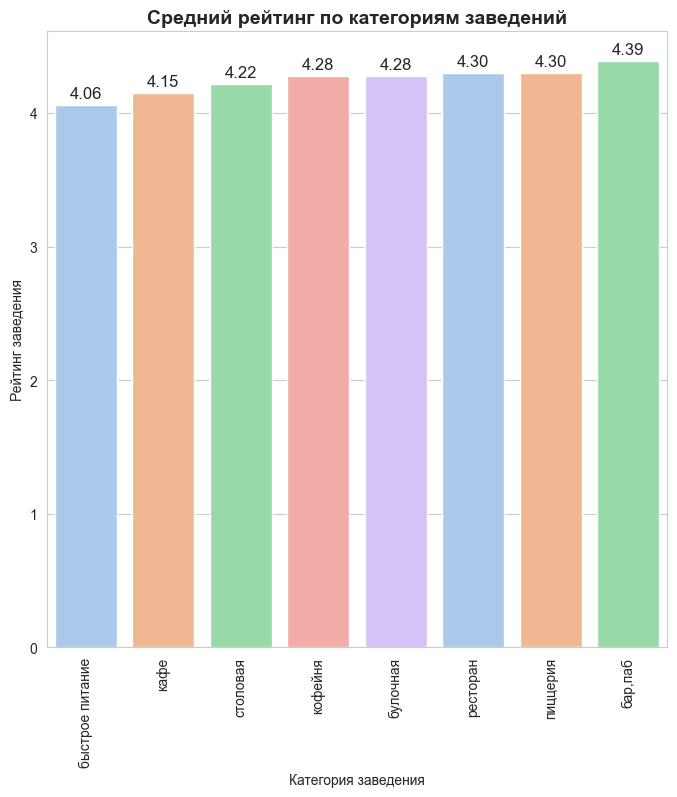

In [404]:
#Построим столбчатую диаграмму
fig, ax = plt.subplots()
ax = sns.barplot(x=data_frame.index,
                  y=data_frame,
                  estimator=sum,
                  ci=None,
                  palette = colors)
plt.xticks(rotation = 90)
ax.set_title('Средний рейтинг по категориям заведений', fontweight="bold", fontsize=14)
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Рейтинг заведения')
#Добавим подписи данных на графике
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(8)

In [405]:
#Напишем цикл для текстового описания столбчатой диаграммы
for _ in range(len(data_frame)):
    (print('У категории `{0}` следующий средний рейтинг: {1}%'
           .format(data_frame.index[_],
                   data_frame[_])))
    print('-------------------------------------------------------------')

У категории `быстрое питание` следующий средний рейтинг: 4.06%
-------------------------------------------------------------
У категории `кафе` следующий средний рейтинг: 4.15%
-------------------------------------------------------------
У категории `столовая` следующий средний рейтинг: 4.22%
-------------------------------------------------------------
У категории `кофейня` следующий средний рейтинг: 4.28%
-------------------------------------------------------------
У категории `булочная` следующий средний рейтинг: 4.28%
-------------------------------------------------------------
У категории `ресторан` следующий средний рейтинг: 4.3%
-------------------------------------------------------------
У категории `пиццерия` следующий средний рейтинг: 4.3%
-------------------------------------------------------------
У категории `бар,паб` следующий средний рейтинг: 4.39%
-------------------------------------------------------------


Можно сказать, что средний рейтинг заведений не сильно разнится, нет резких перепадов, но на основании диаграммы 3 последних места по рейтингу занимают довольно массовые и доступные места питания, можно предположить, что чем ниже средний чек, тем ниже рейтинг, проверим это:

In [406]:
#Создадим отдельный датафрейм без заглушек
for_m = df[df['middle_avg_bill']!='не_указано']
#Переведем тип значений столбца во float
for_m['middle_avg_bill'] = for_m['middle_avg_bill'].astype('float')

In [407]:
#Создадим series для определения среднего чека для каждой категории заведения
data_frame_2 = round(for_m.groupby(['category'])['middle_avg_bill'].mean().sort_values(), 2) 

In [408]:
#Создадим датафрейм для построения диаграммы рассеяния
for_scatter = pd.DataFrame(columns=['avg_rating', 'avg_bill'])
for_scatter['avg_rating'] = data_frame
for_scatter['avg_bill'] = data_frame_2
for_scatter

,avg_rating,avg_bill
category,,
быстрое питание,4.06,442.99
кафе,4.15,705.38
столовая,4.22,335.35
кофейня,4.28,614.21
булочная,4.28,658.77
ресторан,4.30,1367.88
пиццерия,4.30,789.38
"бар,паб",4.39,1338.76


In [409]:
#Строим scatter
fig = px.scatter(for_scatter,             #Загружаем данные
                 x='avg_bill', #Указываем столбец с данными для оси X
                 y='avg_rating',  #Указываем столбец с данными для оси Y
                 color=for_scatter.index) #Обозначаем категорию для разделения цветом
#Оформляем график
fig.update_layout(title='Зависимость рейтинга от среднего чека за посещение',
                   xaxis_title='Рейтинг заведения',
                   yaxis_title='Средний чек')

fig.show() 

Отчасти, чем выше средний чек, тем выше рейтинг у заведения, можно предположить, что в таких местах (*столовые, точки быстрого питания, кафе*) меньше внимания уделяют сервису или внутреннему оформлению заведения.

### Фоновая картограмма

In [410]:
#Создадим датафрейм с наименованием районов и медианным рейтингом
rating_df = (df
             .groupby('district', as_index=False)['rating']
             .agg('median')
             .sort_values(by='rating', ascending = False))
rating_df

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
6,Юго-Восточный административный округ,4.2


In [411]:
#Читаем файл и сохраняем в переменной
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [412]:
#Загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#Создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

#Выводим карту
m

В центре Москвы оценки заведений по медиане выше, чем в остальных райнах, можно сказать, что по всей Москве кроме:
- Центрального административного округа (оценка 4.4);
- Юго-Восточный административный округа (оценка 4.2).

медианные оценки одинаковы


### Все заведения на карте при помощи кластеров

In [413]:
#Создаём карту Москвы
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#Создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_2)

#Пишем функцию, которая принимает строку датафрейма,
#Создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#Применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

#Выводим карту
m_2

В центре Москвы заведений гораздо больше, чем в остальных райнах, меньше всего заведений в Юго-Восточном административном округе.

### Топ - 15 улиц по количеству заведений

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [414]:
#Создадим датасет в котором будут наши улицы из топ - 15
top_streets = (df
               .groupby('street', as_index = False)
               .agg({'district':'count'})
               .sort_values(by='district',ascending=False)
               .head(15)
               .reset_index(drop=True).rename(columns = {'district':'count_of_places'}))
top_streets

,street,count_of_places
0,проспект Мира,179
1,Профсоюзная улица,117
2,проспект Вернадского,103
3,Ленинский проспект,99
4,Ленинградский проспект,90
5,Дмитровское шоссе,89
6,Каширское шоссе,72
7,Варшавское шоссе,69
8,Ленинградское шоссе,66
9,Люблинская улица,58


In [415]:
#Создадим сводную таблицу для построения барплота
pivot_street = df[df['street'].isin(list(top_streets['street']))].pivot_table(index='street',
                                                                            columns='category',
                                                                            values =['district'],
                                                                            aggfunc ='count')

In [416]:
#Удалим лишний уровнь индексов
pivot_street = pivot_street.droplevel(0, axis=1)

In [417]:
#Отсортируем датасет по количеству заведений
pivot_street['sum'] = pivot_street.sum(axis=1)
pivot_street = pivot_street.sort_values(by='sum', ascending = False)

In [418]:
pivot_street

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
street,,,,,,,,,
проспект Мира,11.0,4.0,22.0,51.0,35.0,11.0,43.0,2.0,179.0
Профсоюзная улица,6.0,4.0,15.0,31.0,18.0,15.0,25.0,3.0,117.0
проспект Вернадского,7.0,1.0,12.0,21.0,16.0,13.0,31.0,2.0,103.0
Ленинский проспект,10.0,3.0,2.0,20.0,23.0,5.0,31.0,5.0,99.0
Ленинградский проспект,15.0,3.0,2.0,11.0,25.0,8.0,24.0,2.0,90.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,25.0,4.0,89.0
Каширское шоссе,1.0,1.0,10.0,15.0,16.0,5.0,19.0,5.0,72.0
Варшавское шоссе,6.0,NaN,7.0,13.0,13.0,4.0,20.0,6.0,69.0
Ленинградское шоссе,4.0,2.0,5.0,12.0,13.0,3.0,24.0,3.0,66.0


In [419]:
#Удалим столбец для удоства построения диаграммы
pivot_street = pivot_street.drop(columns=['sum'])

In [420]:
#Построим столбчатую диаграмму
fig = px.bar(pivot_street,
             x=pivot_street.index,
             y=pivot_street.columns)


#Оформим график
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Количество заведений различных категорий по улицам (топ - 15)',
                   xaxis_title='Название района',
                   yaxis_title='Количество заведений')
fig.show() 

In [421]:
#Напишем цикл для текстового описания столбчатой диаграммы
for _ in range(len(top_streets)):
    (print('На улице {0} находится: {1} заведений'.format(top_streets['street'][_], top_streets['count_of_places'][_])))
    print('----------------------------------------')

На улице проспект Мира находится: 179 заведений
----------------------------------------
На улице Профсоюзная улица находится: 117 заведений
----------------------------------------
На улице проспект Вернадского находится: 103 заведений
----------------------------------------
На улице Ленинский проспект находится: 99 заведений
----------------------------------------
На улице Ленинградский проспект находится: 90 заведений
----------------------------------------
На улице Дмитровское шоссе находится: 89 заведений
----------------------------------------
На улице Каширское шоссе находится: 72 заведений
----------------------------------------
На улице Варшавское шоссе находится: 69 заведений
----------------------------------------
На улице Ленинградское шоссе находится: 66 заведений
----------------------------------------
На улице Люблинская улица находится: 58 заведений
----------------------------------------
На улице Кутузовский проспект находится: 53 заведений
--------------------

По графику видно, что подавляющее большинство от всех заведений на каждой улице составляют рестораны и кафе и кофейни.

### Улицы с одним объектом общепита

In [422]:
#Создадим датасет в котором будут улицы с одним заведением общепита
low_streets = (df
               .groupby('street', as_index = False)
               .agg({'district':'count'})
               .sort_values(by='district',ascending=False)
               .reset_index(drop=True).rename(columns = {'district':'count_of_places'}))
#Оставим улицы только с одним объектом общепита
low_streets = low_streets[low_streets['count_of_places']==1]

In [423]:
low_streets

,street,count_of_places
939,улица Расковой,1
940,улица Луиджи Лонго,1
941,улица Седова,1
942,улица Ремизова,1
943,улица Кондратюка,1
...,...,...
1362,Ордынский тупик,1
1363,Оренбургская улица,1
1364,Орловский переулок,1
1365,Оршанская улица,1


In [424]:
one_place = df[df['street'].isin(list(low_streets['street']))]
one_place

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,не_указано,0,180.0,улица Бусиновская Горка,False
19,19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,не_указано,не_указано,не_указано,не_указано,1,не_указано,Ижорский проезд,True
21,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,не_указано,не_указано,не_указано,не_указано,0,не_указано,Прибрежный проезд,False
54,58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,не_указано,1,не_указано,Угличская улица,False
65,69,Алазанская долина,ресторан,"Москва, Шенкурский проезд, 14",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.897679,37.591366,4.3,высокие,Средний счёт:1500–2000 ₽,1750.0,не_указано,0,50.0,Шенкурский проезд,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7785,8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,не_указано,не_указано,не_указано,не_указано,1,не_указано,Кузьминская улица,False
7817,8349,Вкусные Традиции,булочная,"Москва, Лермонтовский проспект, 6",Юго-Восточный административный округ,"ежедневно, 09:00–21:00",55.702668,37.848193,4.6,не_указано,не_указано,не_указано,не_указано,0,не_указано,Лермонтовский проспект,False
7845,8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,не_указано,не_указано,не_указано,не_указано,1,40.0,Новороссийская улица,False
7858,8393,Doner Pro,быстрое питание,"Москва, 11-я улица Текстильщиков, 1",Юго-Восточный административный округ,"ежедневно, 10:00–03:00",55.705155,37.736415,4.0,не_указано,не_указано,не_указано,не_указано,0,80.0,11-я улица Текстильщиков,False


In [425]:
# Создадим сводную таблицу, содержащую топ - 15 заведений по их количеству
pivot_one = (one_place.pivot_table(index = ['category','name','chain'], 
                       values =['street'],
                       aggfunc ='count')
         .sort_values(by='street',ascending=False)
         .rename(columns={'street': 'count_of_places'}))

In [426]:
pivot_one

count_of_places
category name           chain                 
кафе     Кафе           0                   12
ресторан Яндекс Лавка   1                    7
кофейня  CofeFest       1                    5
пиццерия Домино'с Пицца 1                    3
столовая Кафе-столовая  0                    3
...                                        ...
кафе     Люди как люди  0                    1
         Лоза           1                    1
         Лагман Хаус    1                    1
         Культ Вкуса    0                    1
столовая Энесай         0                    1

[389 rows x 1 columns]

In [427]:
#Сделаем датасет для построения барплота
for_barplot = (pivot_one
               .droplevel([1,2],axis=0)
               .groupby((pivot_one.droplevel([1,2],axis=0)).index)
               .agg({'count_of_places':'sum'})
               .sort_values(by='count_of_places', ascending = False))

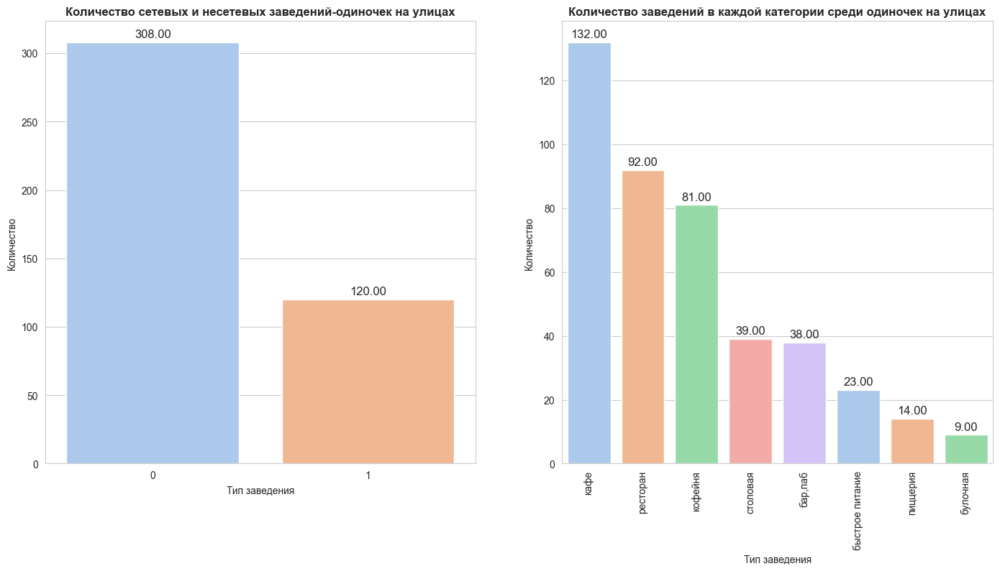

In [428]:
#Сохраним цветовую палетку в переменную
colors = sns.color_palette('pastel')[0:5]

#Зададим оси
fig, (ax1, ax2) = plt.subplots(1, 2)

#Построим первый график 
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x=pivot_one.index.get_level_values('chain'),
                  y=pivot_one['count_of_places'],
                  estimator=sum,
                  ci=None,
                  palette = colors)
ax1.set_title('Количество сетевых и несетевых заведений-одиночек на улицах', fontweight="bold", fontsize=12)
ax1.set_xlabel('Тип заведения')
ax1.set_ylabel('Количество')
#Добавим подписи данных на графике
for bar in ax1.patches:
    ax1.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
    
#Построим второй график
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x=for_barplot.index,
                  y=for_barplot['count_of_places'],
                  ci=None,
                  palette = colors)
plt.xticks(rotation = 90)
ax2.set_title('Количество заведений в каждой категории среди одиночек на улицах', fontweight="bold", fontsize=12)
ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Количество')
#Добавим подписи данных на графике
for bar in ax2.patches:
    ax2.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(17)

Среди заведений - одиночек на улицах несетевых заведений в более чем 2 раза больше, чем сетевых.

Среди таких заведений представлены все категории. 

Заведения - одиночки в разрезе категории (категории - количество заведений):
- Кафе - 132
- Ресторан - 92
- Кофейня - 81
- Столовая - 39
- Бар, паб - 38
- Быстрое питание - 23
- Пиццерия - 14
- Булочная - 9

### Медианное значение среднего чека по районам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [429]:
middle_df = df[df['middle_avg_bill']!='не_указано']
middle_df['middle_avg_bill'] = middle_df['middle_avg_bill'].astype('float')

In [430]:
#Создадим датафрейм с наименованием районов и медианным рейтингом
middle_avg_bill_df = middle_df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_df = middle_avg_bill_df.sort_values(by='middle_avg_bill').reset_index(drop=True)

In [431]:
#Загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#Создаём карту Москвы
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m_3)

#Выводим карту
m_3

In [432]:
for _ in range(len(middle_avg_bill_df)):
    (print('В районе {0} медианна среднего чека составляет: {1} рублей'.format(middle_avg_bill_df['district'][_],
                                                          middle_avg_bill_df['middle_avg_bill'][_])))
    print('-----------------------------------------------------------------------------')

В районе Юго-Восточный административный округ медианна среднего чека составляет: 450.0 рублей
-----------------------------------------------------------------------------
В районе Северо-Восточный административный округ медианна среднего чека составляет: 500.0 рублей
-----------------------------------------------------------------------------
В районе Южный административный округ медианна среднего чека составляет: 500.0 рублей
-----------------------------------------------------------------------------
В районе Восточный административный округ медианна среднего чека составляет: 575.0 рублей
-----------------------------------------------------------------------------
В районе Юго-Западный административный округ медианна среднего чека составляет: 600.0 рублей
-----------------------------------------------------------------------------
В районе Северный административный округ медианна среднего чека составляет: 650.0 рублей
-------------------------------------------------------------

Самые большие медианные чеки в `центральном административном округе` и `западном административном округе` - 1000 рублей.

Интересная особенность, что в аэропорте `Внуково` также очень высокие цены, что логично.


## Вывод

<a id="end"></a>
[Описание проекта](#introduction)

**По Москве категории заведений распределены следующим образом (в порядке убывания количества заведений):**

- Количество заведений категории кафе составляет:2003 заведений(25.45%)

- Количество заведений категории ресторан составляет:1969 заведений(25.02%)

- Количество заведений категории кофейня составляет:1398 заведений(17.76%)

- Количество заведений категории пиццерия составляет:628 заведений(7.98%)

- Количество заведений категории бар,паб составляет:747 заведений(9.49%)

- Количество заведений категории быстрое питание составляет:570 заведений(7.24%)

- Количество заведений категории булочная составляет:249 заведений(3.16%)

- Количество заведений категории столовая составляет:306 заведений(3.89%)

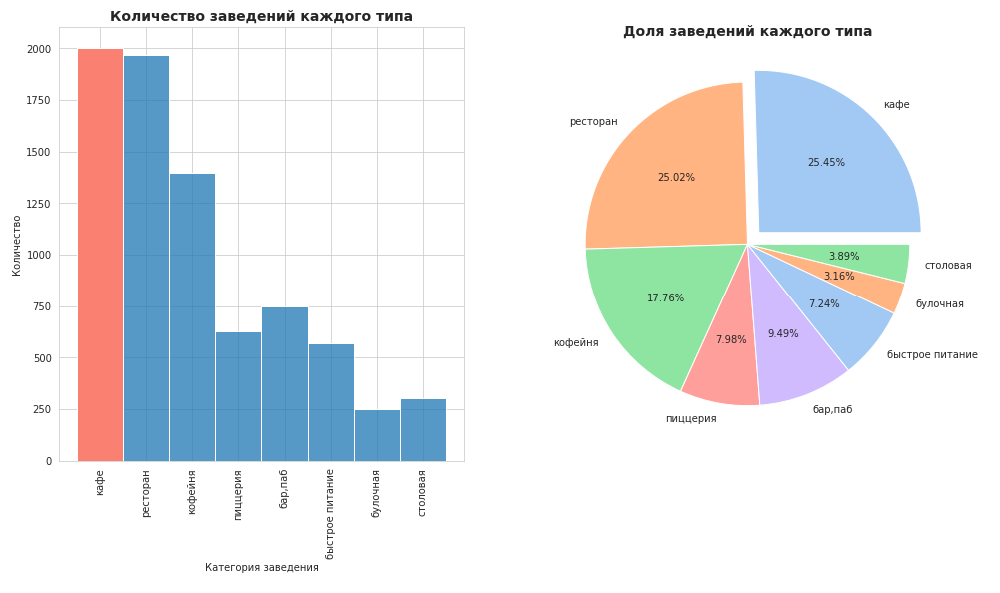

---------------

**По Москве медианные значения мест по каждой категории заведений распределены следующим образом (в порядке убывания количества мест):**
- Медианное значение мест для категории ресторан составляет:86.0
- Медианное значение мест для категории бар,паб составляет:82.5
- Медианное значение мест для категории кофейня составляет:80.0
- Медианное значение мест для категории столовая составляет:73.5
- Медианное значение мест для категории быстрое питание составляет:69.5
- Медианное значение мест для категории кафе составляет:60.0
- Медианное значение мест для категории пиццерия составляет:55.0
- Медианное значение мест для категории булочная составляет:50.0

Самое:
- большое медианное значение у заведений типа ресторан - 86
- маленькое медианное значение у заведений типабулочная - 50

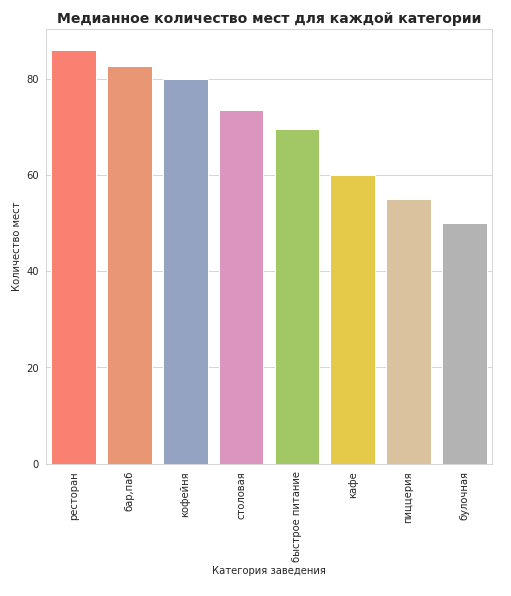

---------------

**По Москве количество:**
- Несетевых заведений - 4781 (60.75%)
- Сетевых заведений - 3089 (39.25%)

Интересное наблюдение, в несетевых местах больше выбросов по количеству мест (можно объяснить тем, что в сетевых местах есть стандарты, в которых определяется даже количество мест)

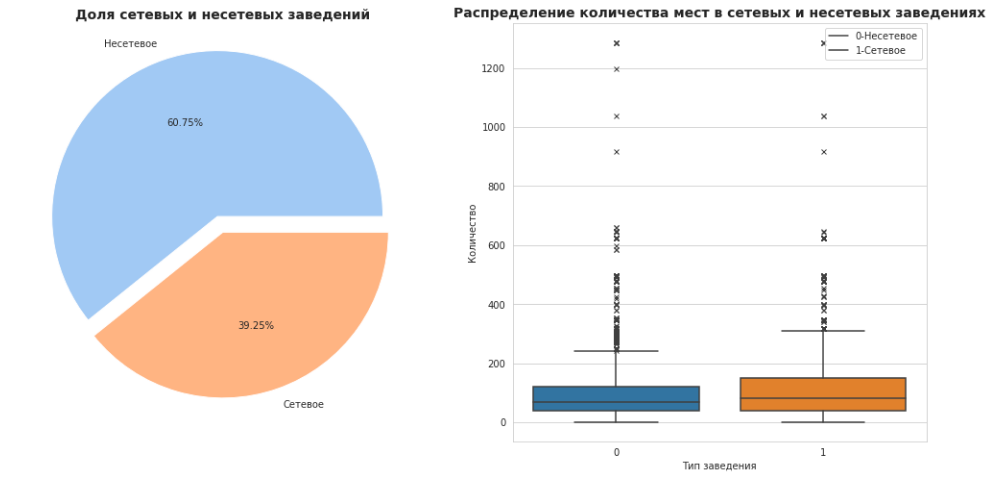

---------------

**В Москве следующие категории заведения чаще являются сетевыми:**
   - булочная (62% сетевых заведений)
   - пиццерия (53% сетевых заведений)
   - кофейня (51% сетевых заведений)


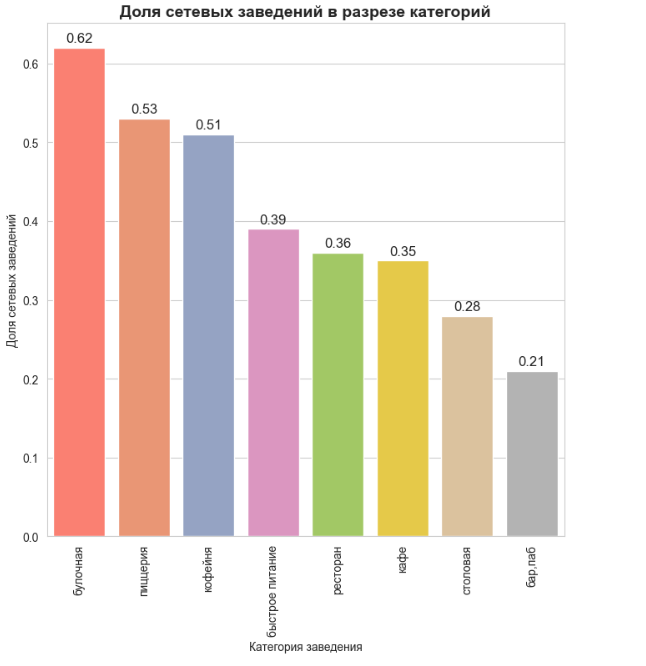

----------------------------

**Топ - 15 по количеству заведений:**
- Сеть Шоколадница занимает следующую долю от всего топ 15: 14.48%
- Сеть Кафе занимает следующую долю от всего топ 15: 9.61%
- Сеть Домино'с Пицца занимает следующую долю от всего топ 15: 9.25%
- Сеть Додо Пицца занимает следующую долю от всего топ 15: 9.0%
- Сеть One Price Coffee занимает следующую долю от всего топ 15: 8.64%
- Сеть Яндекс Лавка занимает следующую долю от всего топ 15: 8.27%
- Сеть Cofix занимает следующую долю от всего топ 15: 7.91%
- Сеть Prime занимает следующую долю от всего топ 15: 5.96%
- Сеть КОФЕПОРТ занимает следующую долю от всего топ 15: 5.11%
- Сеть Кулинарная лавка братьев Караваевых занимает следующую долю от всего топ 15: 4.74%
- Сеть Теремок занимает следующую долю от всего топ 15: 4.38%
- Сеть CofeFest занимает следующую долю от всего топ 15: 3.77%
- Сеть Шаурма занимает следующую долю от всего топ 15: 3.04%
- Сеть Drive Café занимает следующую долю от всего топ 15: 2.92%
- Сеть Буханка занимает следующую долю от всего топ 15: 2.92%

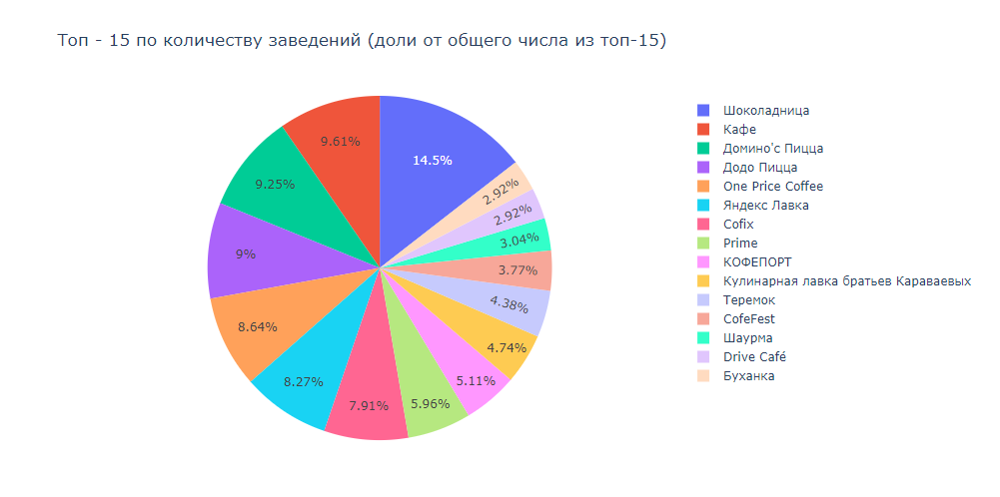

---------------------------------------------------

**В топ - 15 попались заведения у которых указано не их оригинальное название, а название по продукту, который они производят (к сетевым заведениям они также не относятся):**
- Кафе (79 заведений с таким названием)
- Шаурма (25 заведений с таким названием)

Количество сетевых заведений в топе явно больше:
- Несетевые (104 заведения) - это те самые заведения под наименованиями `Кафе` и `Шаурма`
- Сетевые (718 заведений)

Количество заведений в каждой категории получилось следующим:
- Кофейня (328)
- Кафе (153)
- Ресторан (150)
- Булочная (142)
- Быстрое питание (25)
- Пиццерия (24ФФ)

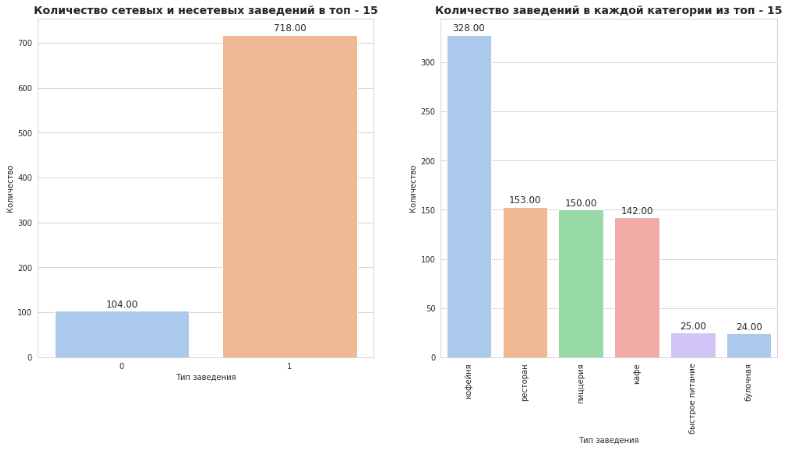

----------------

**Москва разделена на следующие районы:**
- Центральный административный округ - больше всего заведений различных категорий
- Западный административный округ
- Южный административный округ
- Северный административный округ
- Северо-Восточный административный округ
- Юго-Западный административный округ
- Восточный административный округ
- Юго-Восточный административный округ
- Северо-Западный административный округ - меньше всего заведений различных категорий

По графику видно, что подавляющее большинство от всех заведений в каждом районе составляют `рестораны` и `кафе`.

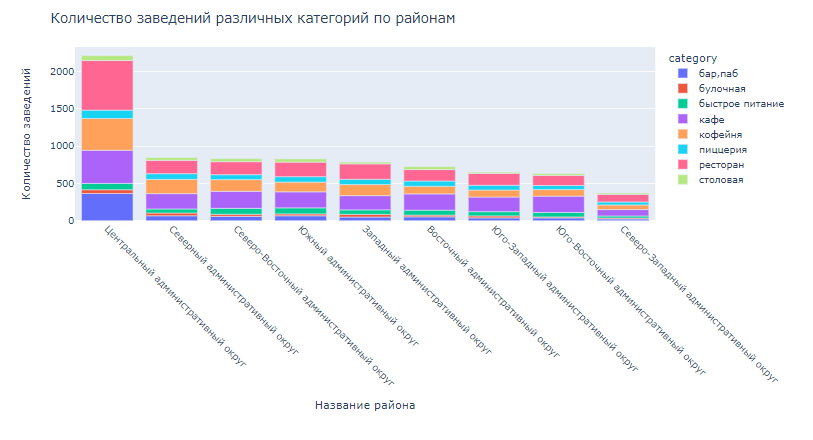

-----------------

**Средний рейтинг заведений:**
- У категории `быстрое питание` следующий средний рейтинг: 4.06%
- У категории `кафе` следующий средний рейтинг: 4.15%
- У категории `столовая` следующий средний рейтинг: 4.22%
- У категории `кофейня` следующий средний рейтинг: 4.28%
- У категории `булочная` следующий средний рейтинг: 4.28%
- У категории `ресторан` следующий средний рейтинг: 4.3%
- У категории `пиццерия` следующий средний рейтинг: 4.3%
- У категории `бар,паб` следующий средний рейтинг: 4.39%

Можно сказать, что средний рейтинг заведений не сильно разнится, нет резких перепадов.
Отчасти, чем выше средний чек, тем выше рейтинг у заведения, можно предположить, что в таких местах (столовые, точки быстрого питания, кафе) меньше внимания уделяют сервису или внутреннему оформлению заведения.

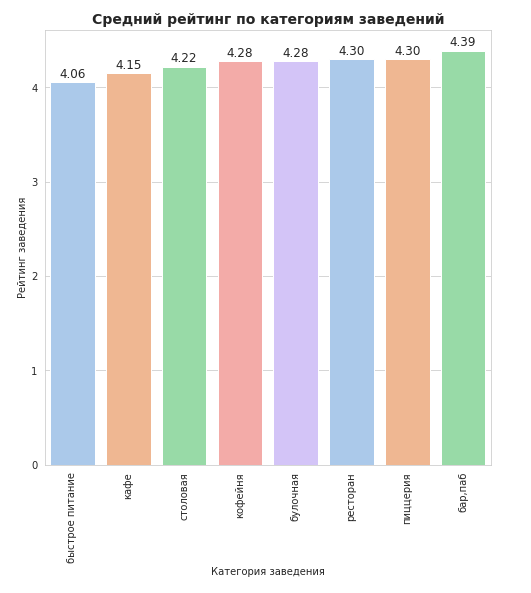

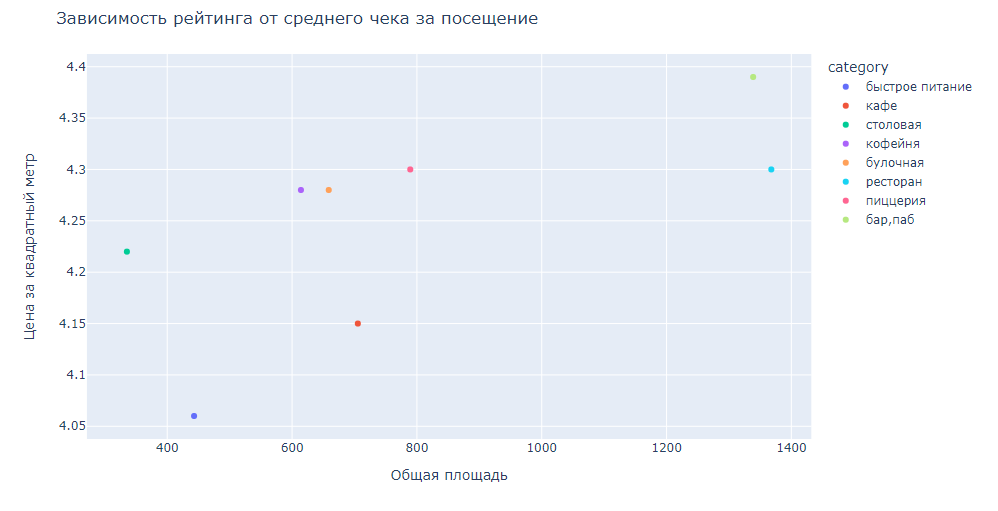

-----------------------

**Количество заведений различных категорий в разрезе топ - 15 улиц:**
- На улице проспект Мира находится: 179 заведений
- На улице Профсоюзная улица находится: 117 заведений
- На улице проспект Вернадского находится: 103 заведений
- На улице Ленинский проспект находится: 99 заведений
- На улице Ленинградский проспект находится: 90 заведений
- На улице Дмитровское шоссе находится: 89 заведений
- На улице Каширское шоссе находится: 72 заведений
- На улице Варшавское шоссе находится: 69 заведений
- На улице Ленинградское шоссе находится: 66 заведений
- На улице Люблинская улица находится: 58 заведений
- На улице Кутузовский проспект находится: 53 заведений
- На улице МКАД находится: 52 заведений
- На улице улица Вавилова находится: 52 заведений
- На улице Пятницкая улица находится: 48 заведений
- На улице улица Миклухо-Маклая находится: 46 заведений
По графику видно, что подавляющее большинство от всех заведений на каждой улице составляют рестораны, кафе и кофейни.

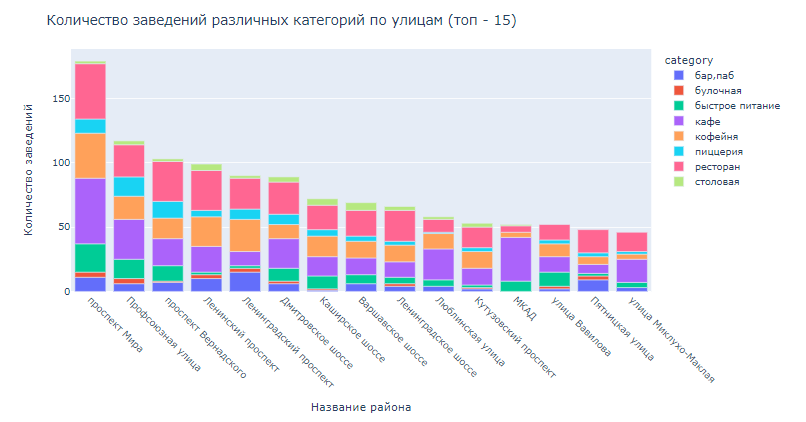

## Детализируем исследование: открытие кофейни

<a id="opencafe"></a>
[Описание проекта](#introduction)

In [433]:
#Создадим датасет, в котором будет информация только о кофейнях
df_coffee_house = df[df['category']=='кофейня']

In [434]:
#Создадим сводную таблицу по районам
coffee_house_pivot = (df_coffee_house
                      .groupby('district', as_index=False)
                      .agg({'seats':'count','rating':'mean'})
                      .sort_values(by='rating', ascending=False)
                      .rename(columns={'seats':'count_of_places','rating':'rating_avg'}).reset_index(drop=True))
coffee_house_pivot

,district,count_of_places,rating_avg
0,Центральный административный округ,426,4.336150
1,Северо-Западный административный округ,62,4.325806
2,Северный административный округ,191,4.292147
3,Восточный административный округ,102,4.276471
4,Юго-Западный административный округ,94,4.274468
5,Южный административный округ,130,4.232308
6,Юго-Восточный административный округ,88,4.217045
7,Северо-Восточный административный округ,157,4.214013
8,Западный административный округ,148,4.191892


In [435]:
coffee_house_pivot['count_of_places'].sum()

1398

Всего в датасете представлено `1398` кофеен.

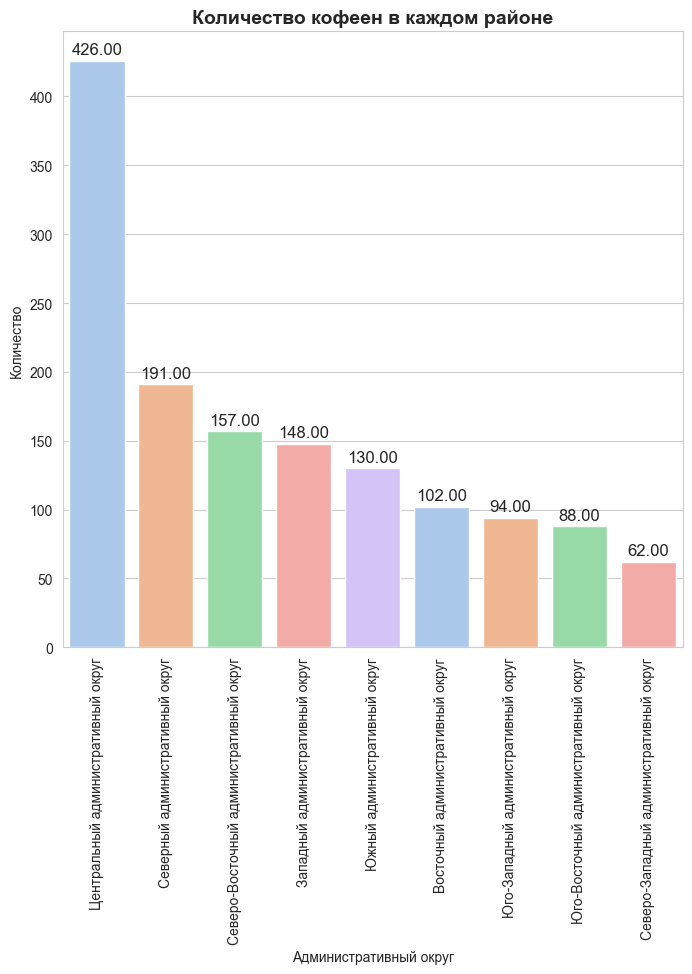

In [436]:
#Построим столбчатую диаграмму
fig, ax = plt.subplots()
ax = sns.barplot(data=coffee_house_pivot.sort_values(by='count_of_places', ascending=False),
                  x='district',
                  y='count_of_places',
                  estimator=sum,
                  ci=None,
                  palette = colors)
plt.xticks(rotation = 90)
ax.set_title('Количество кофеен в каждом районе', fontweight="bold", fontsize=14)
ax.set_xlabel('Административный округ')
ax.set_ylabel('Количество')
#Добавим подписи данных на графике
for bar in ax.patches:
    ax.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')
#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(8)

Больше всего кофеен в: 
- Центральном административном округе - 426
- Северном административном округе - 191
- Северо-Восточном административном округе - 157

Имеет смысл рассмотреть для открытия кофейни северный административный округ и северо - восточный административный округ, если мы хотим избежать высокой конкуренции, ведь центр уже переполнен кофейнями, а в данных районах количество кофеен также довольно высоко (но до количества в центре еще далеко), значит они пользуются спросом, также данные районы можно назвать туристическими, соответсвенно, высокопроходимые, особенно, северо - восточный, в котором находятся ВДНХ и Останкино.

In [437]:
#Составим сводную таблицу для изучения круглосуточных и некруглосуточных кофеен
pivot_24 = (df_coffee_house
            .groupby('is_24/7', as_index=False)
            .agg({'district': 'count','rating':'mean'})
            .rename(columns={'district':'count'}))

In [438]:
pivot_coffe_price = df[df['middle_coffee_cup']!='не_указано']
pivot_coffe_price['middle_coffee_cup'] = pivot_coffe_price['middle_coffee_cup'].astype('float')
pivot_coffe_price = pivot_coffe_price.groupby('is_24/7', as_index=False).agg({'middle_coffee_cup': ['mean','median']})
pivot_coffe_price = pivot_coffe_price.droplevel(0,axis=1)

In [439]:
pivot_24['middle_coffee_cup'] = round(pivot_coffe_price['mean'], 2)
pivot_24['median_coffee_cup'] = round(pivot_coffe_price['median'], 2)
pivot_24['is_24/7'] = ['Некруглосуточное', 'Круглосуточное']

In [440]:
pivot_24

,is_24/7,count,rating,middle_coffee_cup,median_coffee_cup
0,Некруглосуточное,1322,4.279198,171.76,165.0
1,Круглосуточное,76,4.202632,238.68,256.0


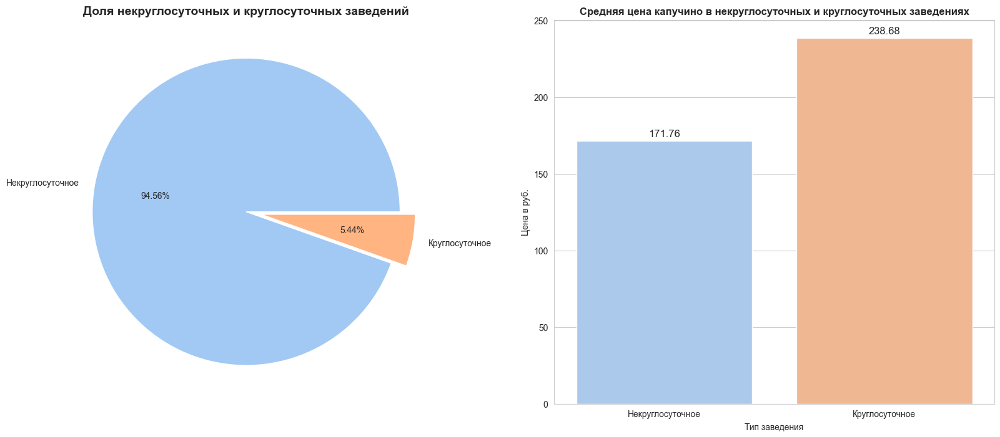

In [441]:

#Сохраним цветовую палетку в переменную
colors = sns.color_palette('pastel')[0:5]

#Зададим оси
fig, (ax1, ax2) = plt.subplots(1, 2)

plt.subplot(1, 2, 1)
ax1 = plt.pie(pivot_24['count'] , labels = pivot_24['is_24/7'], colors = colors, autopct='%.2f%%', explode=(0.0,0.1))
plt.title('Доля некруглосуточных и круглосуточных заведений', fontweight="bold", fontsize=14)
#Построим первый график 

plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='is_24/7',
                  y='middle_coffee_cup',
                  data=pivot_24,
                  estimator=sum,
                  ci=None,
                  palette = colors)
ax2.set_title('Средняя цена капучино в некруглосуточных и круглосуточных заведениях', fontweight="bold", fontsize=12)
ax2.set_xlabel('Тип заведения')
ax2.set_ylabel('Цена в руб.')
#Добавим подписи данных на графике
for bar in ax2.patches:
    ax2.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=12, xytext=(0, 8),
                   textcoords='offset points')

#Задаем ширину и высоту общему графику
fig.set_figheight(8) 
fig.set_figwidth(20)

Стоит ориентироваться на среднюю цену чашки капучино в некруглосуточных заведениях, потому что они более массовы, соответственно, для рядового потребителя предпочтетельней и привычной цена будет в `~171.76 рублей`

Также если мы посмотрим на медианное значение цены на чашку капучино, то эта цена в `165 рублей`

In [442]:
#Загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#Создаём карту Москвы
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_house_pivot,
    columns=['district', 'rating_avg'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_4)

#Выводим карту
m_4

Самый лучший рейтинг у кофеен, которые находятся в следующих районах:
- Центральный административный округ	- 4.33
- Северо-Западный административный округ - 4.32
- Северный административный округ	- 4.29


Общая картина такова, что все рейтинги находятся в диапозоне `4.19-4.33`, что нельзя назвать большим разбросом, значит, можно сказать, что во всех районах рейтинг кофеен практически одинаков и выбор района для открытия кофейни не повлияет на наш рейтинг.

**Ответ на вопрос: `На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?`**

На основании всего вышеперечисленного можно сделать вывод о том, что стоимость нашей чашки капучино будет варьироваться от *`165 до 172 рублей`*.

## Сводные рекомендации по открытию кофейни

<a id="#recommendation"></a>
[Описание проекта](#introduction)

**Районы, которые имеет смысл рассмотреть для открытия:**
- Центральном административном округе (ожидается высокая конкуренция)
- Северном административном округе
- Северо-Восточном административном округе

Имеет смысл рассмотреть для открытия кофейни `северный административный округ` и `северо - восточный административный округ`, если мы хотим избежать высокой конкуренции, ведь центр уже переполнен кофейнями, а в данных районах количество кофеен также довольно высоко (но до количества в центре еще далеко), значит они пользуются спросом, также данные районы можно назвать туристическими, соответсвенно, высокопроходимые, особенно, северо - восточный, в котором находятся ВДНХ и Останкино.

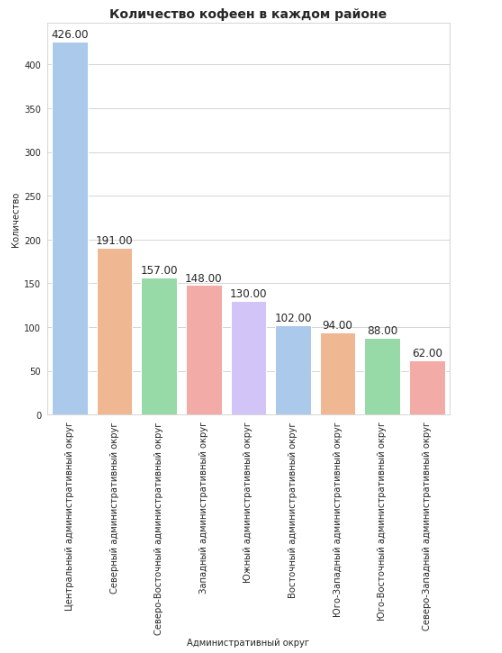

**Средняя цена чашки кофе**

Стоит ориентироваться на средний чек в некруглосуточных заведениях, потому что они более массовы, соответственно, для рядового потребителя предпочтетельней и привычной цена будет в `~171.76 рублей`

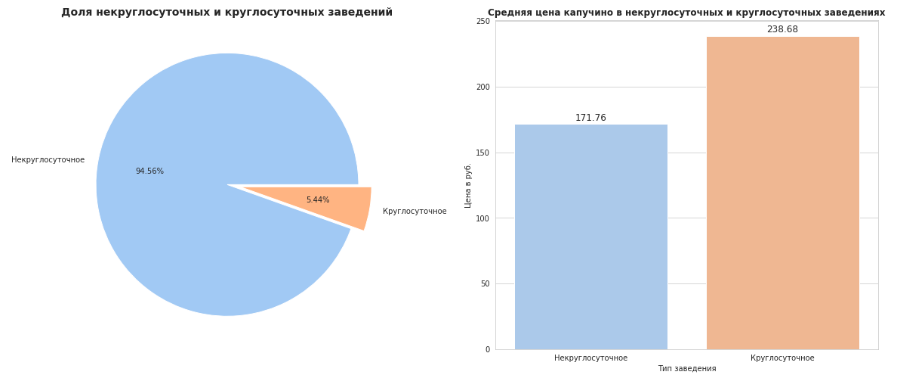

**Рейтинг кофеен в различных районах**

Самый лучший рейтинг у кофеен, которые находятся в следующих районах:
- Центральный административный округ	- 4.33
- Северо-Западный административный округ - 4.32
- Северный административный округ	- 4.29


Общая картина такова, что все рейтинги находятся в диапозоне `4.19-4.33`, что нельзя назвать большим разбросом, значит, можно сказать, что во всех районах рейтинг кофеен практически одинаков и выбор района для открытия кофейни не повлияет на наш рейтинг.